In [1]:
from anndata import read_h5ad
import pandas as pd
import numpy as np
import scvi
import scanpy as sc

%load_ext nb_black
use_cuda = True


In [2]:
import matplotlib.pyplot as plt

%matplotlib inline

In [3]:
data_path = "../TabulaSapiensData/"

In [4]:
adata = read_h5ad(data_path + "decontX/Pilot1_Pilot2.decontX.h5ad")

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9002. The TBB threading layer is disabled.
  warnings.warn(problem)
/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


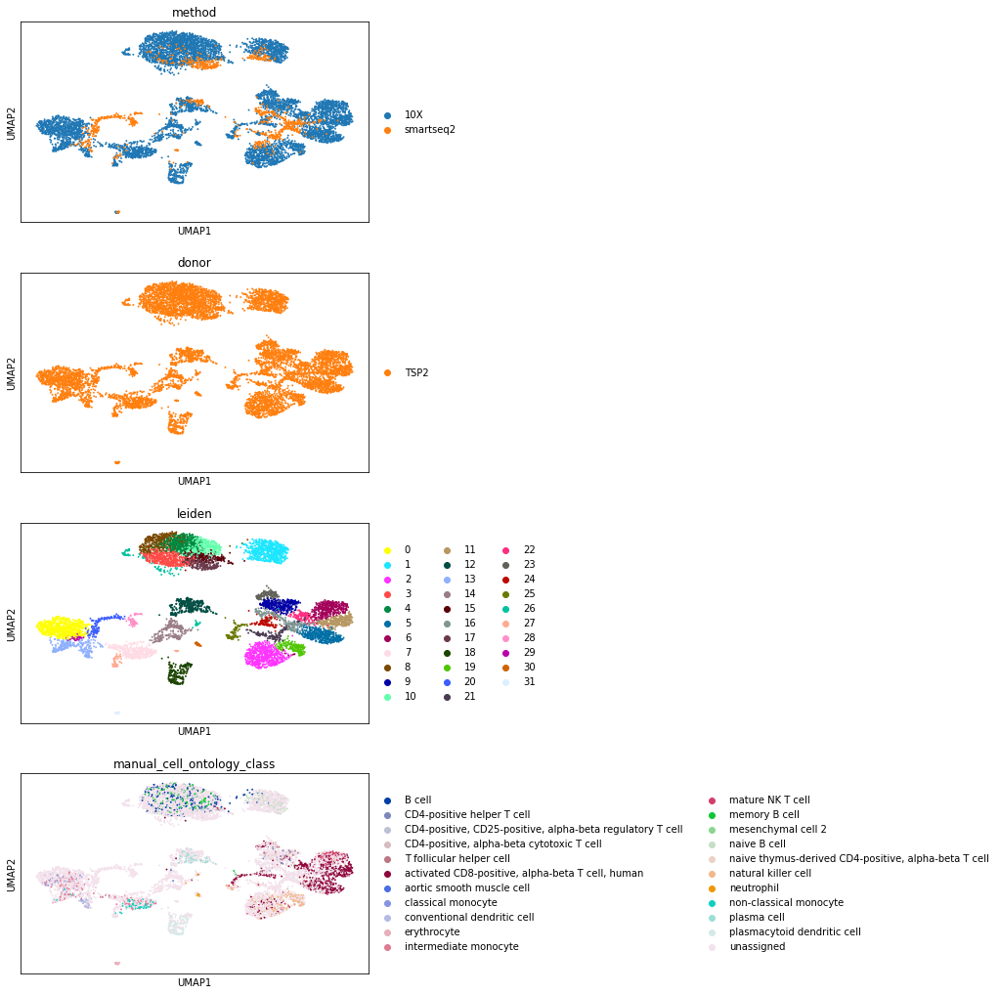

In [5]:
organ = "Spleen"
organ_adata = adata[adata.obs["tissue"] == organ]
sc.pp.neighbors(organ_adata, use_rep="X_scvi_decontX")
sc.tl.umap(organ_adata)
organ_adata.obsm["X_umap_decontX"] = organ_adata.obsm["X_umap"].copy()
sc.tl.leiden(organ_adata, resolution=2)
sc.pl.umap(
    organ_adata,
    color=["method", "donor", "leiden", "manual_cell_ontology_class"],
    ncols=1,
)
organ_adata.X = np.log1p(organ_adata.X)

# cluster to celltype correspondance
count is a matrix of cluster-cell type correspondance, where each row is a celltype, and each colum is a cluster. The entries to the matrix is the number of cells that is annotated as celltype *X* and cluster *Y*

In [6]:
count = {}
for c in np.unique(organ_adata.obs["leiden"]):
    count[c] = {}
    for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
        count[c][t] = np.sum(
            (organ_adata.obs["leiden"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )

count = pd.DataFrame.from_dict(count)

We can visualize the cluster assignment of each cell type through this heatmap. The color is normalized for each celltype 

<AxesSubplot:>

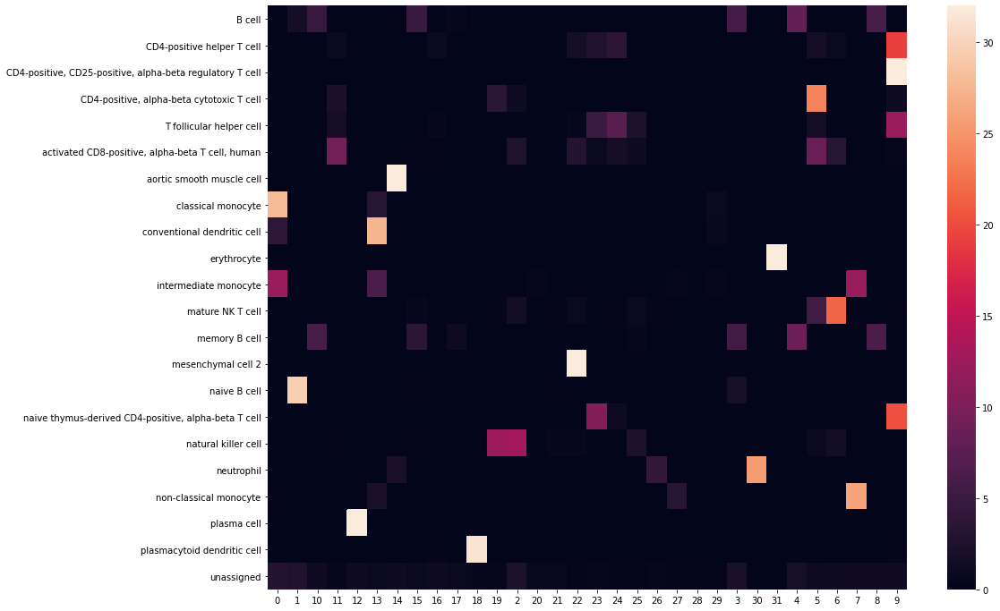

In [7]:
import seaborn

plt.figure(figsize=(16, 12))
seaborn.heatmap((count.T / count.mean(axis=1)).T)

# dictionary of cell type composition of each cluster 
What are clusters previously annotated as 

In [8]:
cluster_composition = {}
for x in count.columns.values:
    t = count.index[count[x] > 0].values
    freq = np.asarray([count.loc[y, x] for y in t]) / count[x].sum()
    res = [a + ": %.2f" % b for a, b in zip(t, freq)]
    cluster_composition[x] = res

In [9]:
cluster_composition["0"]

['classical monocyte: 0.05',
 'conventional dendritic cell: 0.01',
 'intermediate monocyte: 0.09',
 'non-classical monocyte: 0.00',
 'unassigned: 0.85']

# Reassign pure clusters
If a cluster is very pure (>95% of annotated cells come from the same celltype, we reassign the clusters to all have the same labels) 

In [10]:
def Purity(x):
    names = x.index
    x = np.asarray(x).ravel()
    x = x[names != "unassigned"]
    return (np.max(x) / np.sum(x), names[np.argmax(x)])

In [11]:
cluster_purity = count.apply(Purity, axis=0).T
confident_clusters = cluster_purity[cluster_purity[0] > 0.95].index

<ipython-input-1-963029a66ab7>:5: RuntimeWarning: invalid value encountered in long_scalars
  return (np.max(x) / np.sum(x), names[np.argmax(x)])


In [12]:
for i in confident_clusters:
    organ_adata.obs.loc[
        organ_adata.obs["leiden"] == i, "new_manual_cell_ontology_class"
    ] = cluster_purity.loc[i, 1]

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'new_manual_cell_ontology_class' as categorical


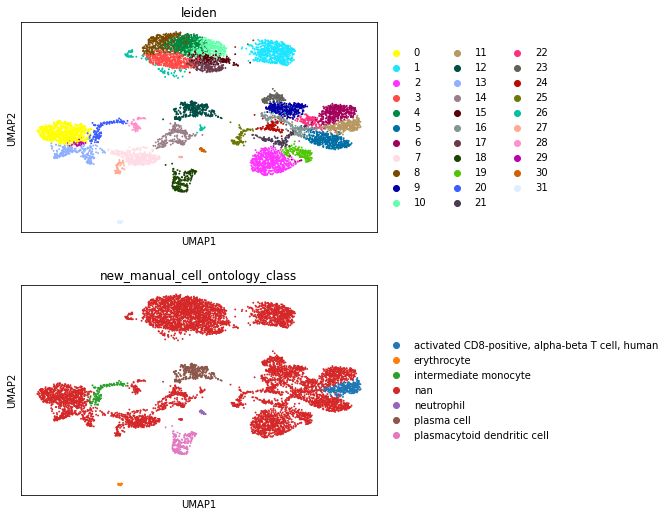

In [13]:
sc.pl.umap(
    organ_adata,
    color=["leiden", "new_manual_cell_ontology_class"],
    ncols=1,
)

# Sankey Diagram between cluster and cell types

In [14]:
from utils.colorDict import donor_colors, method_colors, compartment_colors, tissue_colors

In [15]:
from utils.plotting_utils import *
from utils.colorDict import compartment_colors

import plotly
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import plotly.io as pio

pio.renderers.default = "notebook"

init_notebook_mode(connected=True)

In [16]:
df = pd.DataFrame(columns=["celltype", "compartment", "count"])
for t in np.unique(organ_adata.obs["manual_cell_ontology_class"]):
    for c in np.unique(organ_adata.obs["compartment_pred_svm"]):
        x = np.sum(
            (organ_adata.obs["compartment_pred_svm"].astype(str) == c)
            & (organ_adata.obs["manual_cell_ontology_class"] == t)
        )
        df = df.append(
            pd.DataFrame([t, c, x], index=["celltype", "compartment", "count"]).T,
            ignore_index=True,
        )


fig = genSankey(
    df,
    cat_cols_color=[compartment_colors(), "#00A1E0"],
    cat_cols=["compartment", "celltype"],
    value_cols="count",
    title="celltype-compartment",
)
iplot(fig, validate=False)
plotly.offline.plot(
    fig, validate=False, filename="figures/celltype_sankey_%s" % organ + ".html"
)  # , output_type='div')

'figures/celltype_sankey_Spleen.html'

# visualize compartment markers

In [17]:
compartment_markers = {
    "Epithelial": ["CDH1", "CLDN4", "EPCAM"],
    "Endothelial": ["CA4", "CDH5", "CLDN5", "PECAM1", "VWF"],
    "Stromal": ["BGN", "DCN", "COL1A2"],
    "Immune": ["LCP1", "PTPRC", "RAC2"],
}

In [18]:
for x in compartment_markers.keys():
    sc.tl.score_genes(organ_adata, compartment_markers[x], score_name="%s_score" % x)

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1094: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



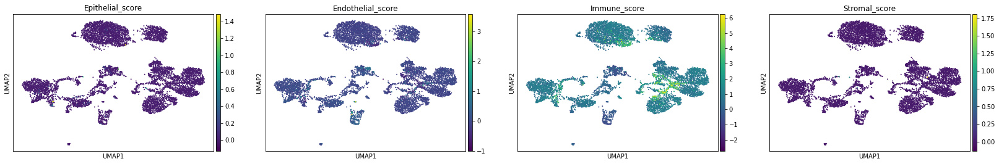

In [19]:
sc.pl.umap(
    organ_adata,
    color=["Epithelial_score", "Endothelial_score", "Immune_score", "Stromal_score"],
)

# Find markers for each cluster

In [20]:
sc.tl.rank_genes_groups(organ_adata, groupby="leiden", method="wilcoxon")

In [21]:
def FormatDE(res):
    groups = res['scores'].dtype.names
    df_res = {}
    for group in groups:
        df = pd.DataFrame([res['scores'][group],
                           res['logfoldchanges'][group],res['pvals_adj'][group]], 
                           columns=res['names'][group],
                           index=['wilcoxon_score','log fold change','adjusted pvalue'])
        df_res[group] = df
    return df_res


In [22]:
DE = FormatDE(organ_adata.uns["rank_genes_groups"])

### top positive marker genes

In [23]:
for x in DE.keys():
    print(x)
    display(DE[x].T[:20])

0


,wilcoxon_score,log fold change,adjusted pvalue
S100A9,40.805115,6.685305,0.000000e+00
S100A8,40.728420,6.381565,0.000000e+00
LYZ,40.199532,6.668093,0.000000e+00
VCAN,39.797138,6.454330,0.000000e+00
FCN1,39.607647,6.218126,0.000000e+00
MNDA,38.768749,4.930919,0.000000e+00
PLAUR,38.432556,4.972071,0.000000e+00
THBS1,38.223492,5.488840,0.000000e+00
C5AR1,38.183910,4.916113,0.000000e+00
S100A6,38.139996,4.557851,0.000000e+00


1


,wilcoxon_score,log fold change,adjusted pvalue
IGHM,38.876694,5.604925,0.000000e+00
IGHD,38.822151,5.978409,0.000000e+00
AL139020.1,34.802139,8.232990,4.430455e-261
YBX3,29.695429,3.147831,1.035673e-189
LINC00926,27.039396,3.516290,3.745657e-157
CD79A,25.844471,2.859680,1.836368e-143
CD37,24.458448,1.955369,2.189833e-128
STAG3,24.051252,3.456206,3.667902e-124
BCL11A,23.840229,2.517442,5.019086e-122
TNFRSF13C,22.190657,2.004336,1.309928e-105


2


,wilcoxon_score,log fold change,adjusted pvalue
GNLY,37.845421,6.493919,0.000000e+00
GZMB,37.457825,5.512872,1.318735e-302
PRF1,36.287323,4.509800,5.031480e-284
NKG7,34.963764,4.308004,1.177446e-263
CD247,34.289024,3.827400,1.346732e-253
KLRD1,34.256496,4.237417,3.425096e-253
FGFBP2,34.161640,5.155384,7.554001e-252
CST7,32.558731,3.489767,1.159270e-228
KLRF1,32.342098,4.460974,1.171959e-225
GZMA,31.456274,3.560322,2.028237e-213


3


,wilcoxon_score,log fold change,adjusted pvalue
TNFRSF13C,24.208925,2.526014,1.054864e-124
MS4A1,23.920414,2.885056,5.528752e-122
BANK1,23.103838,2.406548,8.313411e-114
CD79A,21.784292,2.578435,3.849631e-101
TXNIP,21.125711,1.870281,4.529222e-95
LTB,21.031429,2.233085,2.845082e-94
CD37,20.730614,1.738855,1.349840e-91
CD52,20.601793,2.002598,1.729896e-90
BLK,20.592808,2.339334,1.874247e-90
LINC01781,20.321314,2.447404,4.458952e-88


4


,wilcoxon_score,log fold change,adjusted pvalue
BANK1,28.402775,3.032195,1.100109e-172
CD79A,28.210405,3.292832,1.282952e-170
RPL28,28.119474,1.998944,1.111155e-169
TNFRSF13C,27.836832,2.910938,2.288417e-166
MS4A1,27.556767,3.212979,4.323022e-163
RPL39,27.127516,1.948245,4.576901e-158
HLA-DQA1,26.866474,2.978439,4.501376e-155
LTB,26.861946,3.071113,4.501376e-155
RPL10P9,26.801182,1.948117,2.047619e-154
RPS28,26.564171,1.887567,1.037171e-151


5


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,27.222878,4.213061,2.049928e-158
LYAR,26.553062,2.673824,6.968496e-151
FGFBP2,24.786726,3.362793,2.446180e-131
GZMB,24.352516,2.919699,8.024428e-127
GZMA,23.949532,2.779166,1.100213e-122
GNLY,23.656528,3.498312,9.921227e-120
CCL5,23.052439,2.825802,1.083449e-113
CD3D,23.049957,2.361505,1.083449e-113
CD2,21.992313,2.248522,1.673575e-103
CD3E,21.423653,2.308995,3.381967e-98


6


,wilcoxon_score,log fold change,adjusted pvalue
CMC1,26.866894,3.500147,3.152274e-154
TRGC2,25.842447,3.753704,8.708176e-143
KLRD1,25.638659,3.480182,1.110224e-140
CCL5,24.812807,3.594101,9.597846e-132
CD7,24.173006,2.951652,5.037703e-125
CD3D,23.874146,2.749427,5.578843e-122
CD3E,23.672991,2.749783,5.756039e-120
PIK3R1,23.386568,2.309211,4.308272e-117
TRDC,22.691710,3.828376,3.538340e-110
IL32,21.731436,2.383435,6.093796e-101


7


,wilcoxon_score,log fold change,adjusted pvalue
C1QB,32.528927,9.033838,2.448563e-227
SLC40A1,32.471432,7.510643,7.946854e-227
APOE,32.397102,8.626174,5.916866e-226
C1QC,32.310593,8.461533,5.900843e-225
C1QA,32.310310,8.339902,5.900843e-225
APOC1,32.195118,8.241534,2.026612e-223
LGMN,31.884207,6.491866,3.717720e-219
LIPA,31.852104,6.679389,9.057608e-219
CREG1,31.779579,5.679978,8.109201e-218
SELENOP,31.566751,8.537308,6.218434e-215


8


,wilcoxon_score,log fold change,adjusted pvalue
RPL28,22.947983,1.996931,9.085938e-112
HLA-DQA1,22.880096,3.089208,2.158747e-111
RPL39,22.433846,1.967520,3.611113e-107
MS4A1,21.721937,2.976679,1.873500e-100
RPL10P9,21.697512,1.927272,2.549850e-100
RPS5,21.476446,2.144506,2.188217e-98
RPL22L1,21.476151,2.356880,2.188217e-98
RPS12,21.393799,2.113715,1.123003e-97
RPL37,21.200485,1.801857,6.182514e-96
RPS8,21.184374,2.012295,7.834544e-96


9


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,25.269981,4.504220,4.021683e-136
TRAC,20.699211,2.505995,1.036346e-90
CD3E,20.605171,2.685255,4.840011e-90
IL32,20.165506,2.426894,2.316205e-86
CD3D,19.612833,2.312637,1.178866e-81
CD3G,18.831001,2.086654,3.538307e-75
BCL11B,18.318945,2.728497,3.872945e-71
LEPROTL1,17.850552,1.697807,1.684810e-67
SARAF,17.515724,0.999816,5.332380e-65
ZFP36L2,16.744665,1.602864,2.804880e-59


10


,wilcoxon_score,log fold change,adjusted pvalue
BANK1,24.954575,3.372417,1.121309e-132
TNFRSF13C,23.880928,3.170129,1.422958e-121
MS4A1,23.494902,3.392188,9.024406e-118
AC027290.2,23.290188,2.680527,8.203817e-116
RALGPS2,22.807512,2.869528,4.547128e-111
TNFRSF13B,22.538330,3.293670,1.714984e-108
CD22,21.891981,2.681693,2.605045e-102
CD79A,21.545746,3.012953,4.271036e-99
PAX5,21.212540,2.896537,4.785080e-96
HLA-DQA1,20.823631,2.773169,1.556349e-92


11


,wilcoxon_score,log fold change,adjusted pvalue
GZMK,25.749586,4.545333,1.917998e-141
CCL5,23.051468,3.698287,4.185357e-113
GZMA,22.445608,3.140427,2.771973e-107
CD3D,22.275799,2.820963,9.336286e-106
TRAC,21.367952,2.592946,3.126274e-97
IL32,20.709297,2.596218,2.802168e-91
CD2,20.561594,2.608114,5.097289e-90
CD3G,19.603975,2.209793,1.016641e-81
CST7,19.599737,2.259156,1.016641e-81
CCL3L1,19.336090,2.652112,1.571621e-79


12


,wilcoxon_score,log fold change,adjusted pvalue
MZB1,29.258293,12.696448,2.073356e-183
DERL3,28.604115,10.733677,1.757826e-175
IGKC,28.051073,13.500543,7.605890e-169
XBP1,27.890757,6.706816,5.067085e-167
PRDX4,27.882881,7.569595,5.067085e-167
SSR4,27.708626,5.956653,5.392658e-165
FKBP11,27.047052,6.358279,3.479162e-157
IGHG2,26.446257,15.023102,2.635498e-150
IGHG1,26.429817,15.685616,3.665458e-150
RRBP1,26.415241,5.291458,4.900358e-150


13


,wilcoxon_score,log fold change,adjusted pvalue
CST3,23.646170,5.895543,7.608526e-119
AIF1,23.247871,5.334404,4.216120e-115
LST1,23.232290,5.118202,4.216120e-115
LYZ,22.803949,5.983502,6.165913e-111
FGL2,22.754229,4.748628,1.534322e-110
COTL1,22.399054,4.050446,3.944564e-107
CEBPD,22.221769,4.259037,1.595721e-105
CLEC7A,22.220663,4.816534,1.595721e-105
C1orf162,21.966471,4.045712,3.942525e-103
SPI1,21.921268,3.796640,9.587443e-103


14


,wilcoxon_score,log fold change,adjusted pvalue
MT-RNR1,17.105162,1.624400,4.595319e-63
MT-ND3,15.369315,1.365611,6.941190e-51
MT-RNR2,15.074569,1.368957,6.120078e-49
MT-CO2,14.176482,0.940729,2.772702e-43
MT-CO3,13.991956,0.926644,3.630904e-42
MT-ATP6,13.967724,0.968220,5.067815e-42
MT-CO1,13.729210,0.892442,1.336280e-40
MT-CYB,12.863525,0.734193,1.200801e-35
MT-ND4,12.045022,0.836716,2.965397e-31
MTND1P23,11.427357,0.961424,3.975819e-28


15


,wilcoxon_score,log fold change,adjusted pvalue
CD79A,17.153242,3.128663,3.499324e-61
MS4A1,16.996502,3.189271,2.565790e-60
CD52,16.434568,2.347886,2.123081e-56
TNFRSF13C,15.681393,2.416557,2.984098e-51
BANK1,15.370188,2.526966,3.054384e-49
HLA-DPA1,14.629139,2.296885,1.796407e-44
HLA-DQA1,14.550587,2.445532,4.869721e-44
FCMR,14.209893,1.593086,5.853615e-42
CIB1,14.052936,1.631376,4.834288e-41
CD22,13.883135,2.121786,4.719004e-40


16


,wilcoxon_score,log fold change,adjusted pvalue
RPS27,21.831736,5.115009,4.444454e-101
IL32,21.812418,7.433144,4.444454e-101
B2M,21.801104,5.538836,4.444454e-101
MT-CYB,21.627300,5.111950,1.463421e-99
MT-CO3,21.284460,4.923797,1.862123e-96
EEF1A1,21.230890,4.675306,4.776073e-96
ACTB,21.224447,6.791602,4.776073e-96
RPL23A,21.167170,4.725915,1.316448e-95
MALAT1,21.164124,4.720755,1.316448e-95
MT-CO2,21.159916,4.610949,1.316448e-95


17


,wilcoxon_score,log fold change,adjusted pvalue
MS4A1,22.630980,8.564757,1.264429e-108
BANK1,21.604416,6.800371,4.804873e-99
HLA-DRA,21.511204,6.565636,2.399702e-98
CD74,21.442244,8.550022,7.940068e-98
CD79A,21.162348,6.728734,2.500527e-95
CD52,21.039143,6.522361,2.821130e-94
HLA-DRB1,21.008696,7.105747,4.592981e-94
MT-ND4,20.945869,4.077052,1.505805e-93
MT-CO3,20.835039,4.945578,1.362802e-92
MT-ATP6,20.688278,3.774660,2.600366e-91


18


,wilcoxon_score,log fold change,adjusted pvalue
ITGA1,23.238876,9.689893,5.505100e-115
LIMCH1,23.238249,9.519762,5.505100e-115
INSR,22.682878,6.156377,1.297503e-109
ARHGAP29,22.556364,8.404636,1.711613e-108
KAZN,22.497192,9.572263,5.206188e-108
PCDH17,22.156288,12.182234,8.901881e-105
CD36,22.031305,6.298467,1.214017e-103
HYAL2,21.891510,7.732787,2.303114e-102
NTN4,21.773075,10.434556,2.731881e-101
PEAK1,21.713537,5.836136,8.997268e-101


19


,wilcoxon_score,log fold change,adjusted pvalue
CD7,19.309748,3.558567,1.616515e-78
CMC1,19.298849,3.888382,1.616515e-78
KLRB1,19.024485,3.923891,2.098426e-76
KLRD1,18.814243,3.819097,8.495913e-75
KLRC1,18.565607,4.656274,7.181451e-73
KLRF1,18.536135,4.007199,1.035532e-72
IL2RB,18.406067,3.758896,9.877467e-72
CD247,17.311272,2.697933,2.846170e-63
GZMK,16.856281,3.678426,6.171030e-60
NKG7,16.809893,3.147892,1.215939e-59


20


,wilcoxon_score,log fold change,adjusted pvalue
SLC11A1,17.939657,8.357866,3.403268e-67
PLAUR,17.487074,7.027651,5.291044e-64
ITGAX,17.346804,6.794283,4.091977e-63
THBS1,17.081375,7.704018,3.005995e-61
ACSL1,16.955933,6.510941,2.048413e-60
S100A9,16.572775,6.143564,1.075807e-57
SAT1,16.315132,5.606258,6.479053e-56
C5AR1,16.044041,5.546256,4.630364e-54
PSAP,15.755930,5.503574,4.090326e-52
TIMP1,15.671995,6.488778,1.383935e-51


21


,wilcoxon_score,log fold change,adjusted pvalue
ZFP36L2,16.626389,4.208318,2.642326e-57
DUSP2,16.030125,6.343288,2.317274e-53
ZFP36,15.888817,5.919717,1.486346e-52
AREG,15.605119,5.922696,9.887911e-51
FOS,14.743834,6.136465,3.968960e-45
H3F3B,14.536905,4.916039,6.938629e-44
DDX5,14.155220,4.734390,1.458236e-41
MT-RNR2,14.096862,3.260882,2.921702e-41
MT-CO3,14.085091,4.129462,3.068160e-41
CXCR4,14.050327,4.576643,4.400981e-41


22


,wilcoxon_score,log fold change,adjusted pvalue
IL7R,17.246780,5.314055,6.964997e-62
TNFAIP3,14.302516,2.919322,6.211988e-42
RORA,12.969237,2.856889,2.788978e-34
KLRB1,12.966495,3.228391,2.788978e-34
CD3E,11.936014,2.340280,9.044368e-29
IL32,11.770782,2.110955,4.643217e-28
CCL5,11.591466,2.466483,3.350239e-27
CD3D,11.475733,1.979896,1.142675e-26
DUSP2,10.981322,1.807373,2.766861e-24
CD69,10.698920,1.752093,5.510850e-23


23


,wilcoxon_score,log fold change,adjusted pvalue
LEF1,14.617602,4.633078,1.276917e-43
IL7R,14.182953,3.530160,3.438748e-41
GAS5,13.742191,1.977206,1.113277e-38
BCL11B,13.413372,2.987022,7.430817e-37
TOB1,13.367130,2.637809,1.023447e-36
CD3E,13.359467,2.688234,1.023447e-36
PRKCQ-AS1,12.999582,3.537348,9.771725e-35
MAL,12.993731,4.579045,9.771725e-35
LDHB,12.829827,1.720605,7.300728e-34
NOSIP,12.791266,2.584177,1.080023e-33


24


,wilcoxon_score,log fold change,adjusted pvalue
IL32,16.562592,4.820787,7.645919e-57
CD3D,15.996007,4.377576,4.010163e-53
TRAC,15.664279,4.323727,5.208501e-51
CD3E,15.183629,3.781343,6.681046e-48
CD2,14.839216,3.867391,9.620012e-46
CD3G,14.438947,3.858990,2.887612e-43
LCK,14.371367,3.484334,6.582541e-43
CTLA4,12.768140,5.714250,1.817513e-33
BCL11B,12.536859,3.080140,3.069289e-32
SPOCK2,12.478716,3.126153,5.742574e-32


25


,wilcoxon_score,log fold change,adjusted pvalue
MKI67,16.668396,8.891054,1.309790e-57
STMN1,16.615622,7.287543,1.581086e-57
SMC4,15.987089,5.276255,3.084903e-53
HMGB2,15.949133,5.570186,4.251617e-53
TUBB,15.888803,5.137315,8.920094e-53
CKS1B,15.728136,5.856214,9.519785e-52
TUBA1B,15.676367,5.126075,1.845595e-51
ASPM,15.639071,8.727799,2.902557e-51
H2AFZ,15.587195,4.178096,5.818559e-51
TOP2A,15.126267,9.041284,6.398459e-48


26


,wilcoxon_score,log fold change,adjusted pvalue
G0S2,4.906106,1.513237,0.000130
BCL2A1,4.877551,0.991693,0.000146
LINC01781,4.620948,1.031669,0.000440
GCA,4.585990,1.155646,0.000506
BASP1,4.258032,0.666776,0.001826
SLC25A37,4.111000,0.977131,0.003155
S100A8,4.100433,1.572308,0.003281
CXCR2,3.975909,3.552344,0.005115
ALPL,3.823029,2.808551,0.008651
CYSTM1,3.706635,1.180636,0.012813


27


,wilcoxon_score,log fold change,adjusted pvalue
C1QC,11.737257,5.481106,8.055976e-28
APOE,11.676679,5.505289,1.410544e-27
APOC1,11.654783,5.549039,1.596346e-27
C1QB,11.613570,6.425699,2.299990e-27
C1QA,11.434676,5.865490,1.651790e-26
CD5L,11.212064,5.368053,1.745501e-25
FTL,11.185712,4.293113,2.169334e-25
SLC40A1,10.912011,4.502448,3.963799e-24
MS4A7,10.830067,4.355765,8.587204e-24
HMOX1,10.683401,4.638916,3.771674e-23


28


,wilcoxon_score,log fold change,adjusted pvalue
CSF3R,8.346930,4.990432,1.249832e-14
IL1R2,8.160035,5.371199,5.569831e-14
S100A9,6.888980,3.643060,5.855096e-10
S100A8,6.620791,3.713408,3.459409e-09
AL512646.1,6.109279,3.671410,7.919142e-08
FTH1P20,5.102748,2.053358,1.884043e-05
IFITM2,4.616561,2.290924,1.798603e-04
ACSL1,4.488563,2.598150,3.138509e-04
S100A12,4.279906,3.110438,7.533924e-04
SLC25A37,4.193776,3.256864,1.062698e-03


29


,wilcoxon_score,log fold change,adjusted pvalue
LYZ,9.709987,5.403394,1.609352e-17
VCAN,9.555297,4.653127,3.627279e-17
S100A8,9.485630,5.090510,4.727731e-17
MNDA,9.346074,3.909374,1.338723e-16
C5AR1,9.269961,3.769318,2.192467e-16
PLAUR,9.128953,4.022538,5.863538e-16
MS4A6A,9.113250,3.469016,5.863538e-16
TIMP1,9.103898,3.611150,5.863538e-16
S100A9,9.100833,5.303294,5.863538e-16
THBS1,9.081687,4.069914,6.293500e-16


30


,wilcoxon_score,log fold change,adjusted pvalue
S100A12,8.982392,6.867207,1.130199e-14
S100A8,8.840083,7.260899,1.407697e-14
GCA,8.708699,4.302280,2.496521e-14
S100A9,8.595513,6.828088,2.648866e-14
FOLR3,8.531163,5.050798,3.221058e-14
CYSTM1,8.427581,4.025897,4.831250e-14
IL1R2,8.367546,4.887403,6.926697e-14
G0S2,8.360859,5.246421,7.048948e-14
ALOX5AP,8.311478,3.330507,8.832127e-14
CSF3R,8.192343,4.130138,1.984462e-13


31


,wilcoxon_score,log fold change,adjusted pvalue
HBB,8.818865,18.580763,2.373060e-14
HBA2,8.815541,15.275167,2.373060e-14
HBA1,8.813840,14.948161,2.373060e-14
ALAS2,8.492032,13.040096,6.486501e-14
GLRX5,8.047405,5.539102,1.016020e-12
DCAF12,7.965460,6.785843,1.615103e-12
SLC25A37,7.877183,5.931302,2.776371e-12
PIM1,7.856608,5.563979,3.227023e-12
ADIPOR1,7.838565,4.593626,3.577136e-12
TMCC2,7.831442,11.471803,3.735949e-12


### for cluster 0 plot the top marker genes

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



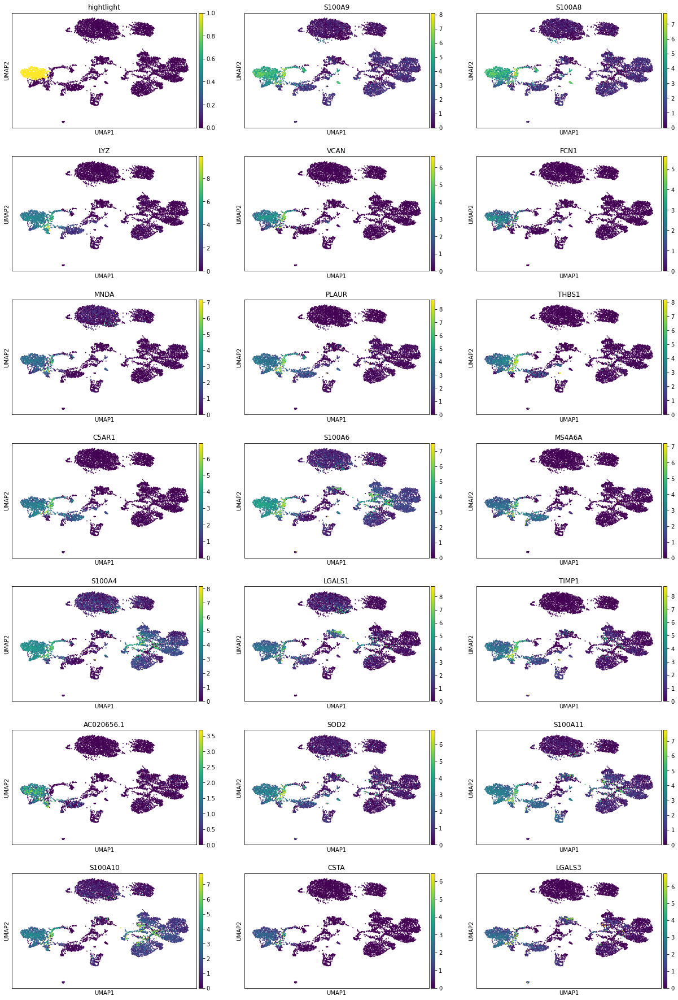

In [24]:
topgenes = list(DE["0"].T[:20].index)
organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == "0"
sc.pl.umap(
    organ_adata,
    color=["hightlight"] + topgenes,
    ncols=3,
)

You can do this for other clusters as well. Here I plot the top 5 genes for all other clusters

0


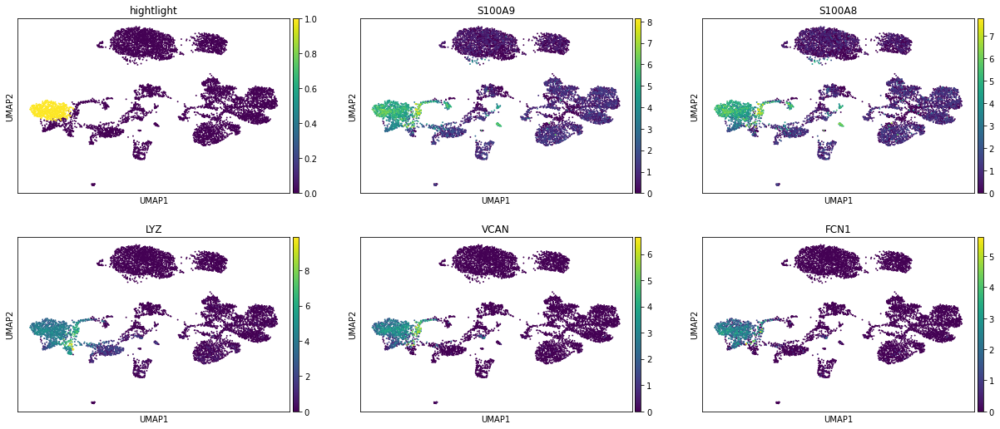

1


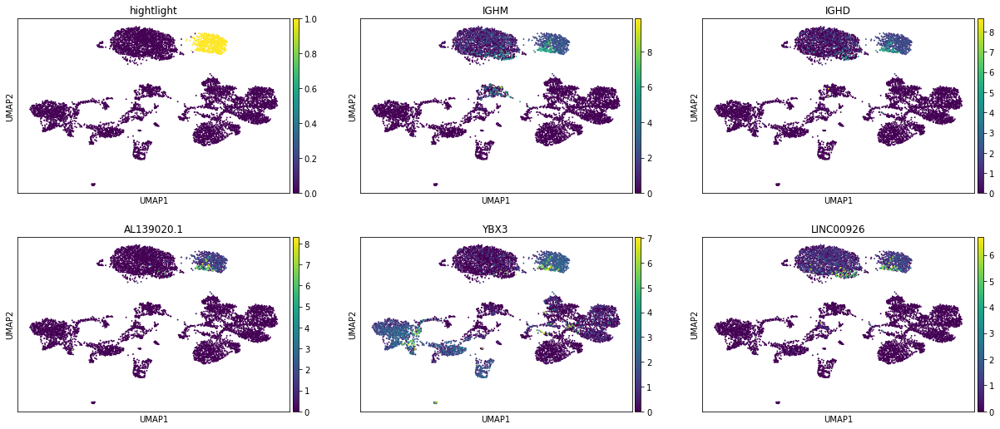

2


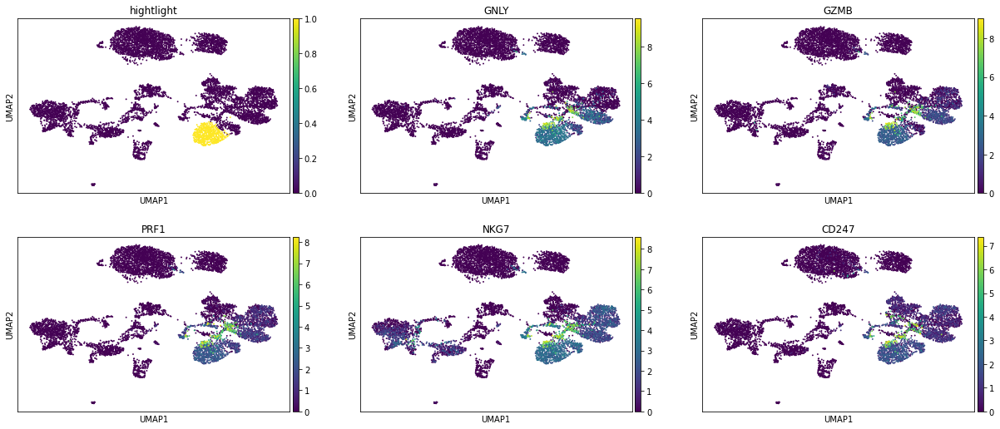

3


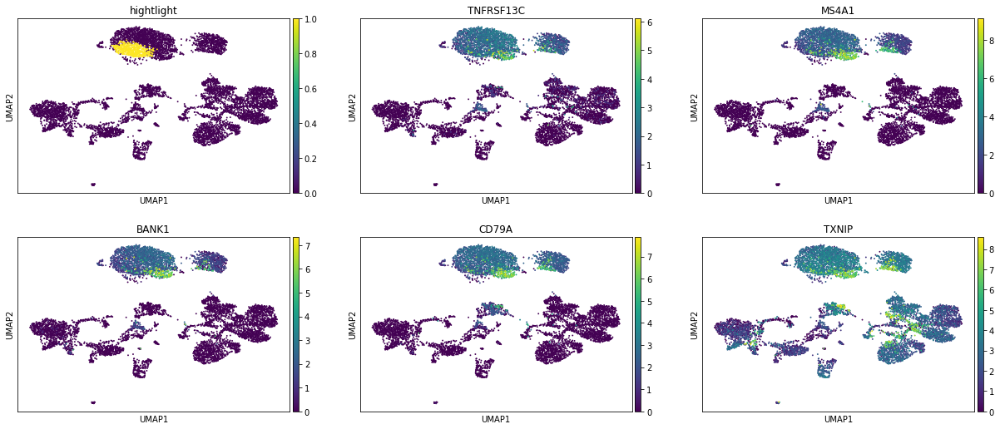

4


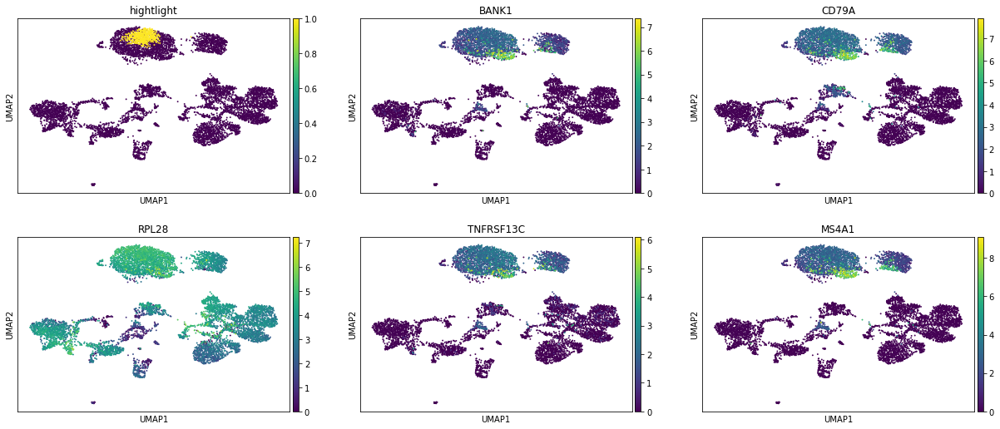

5


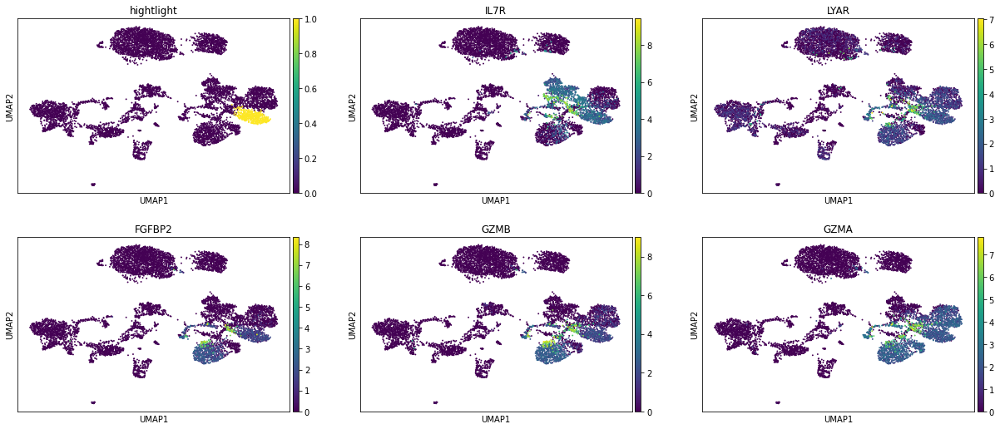

6


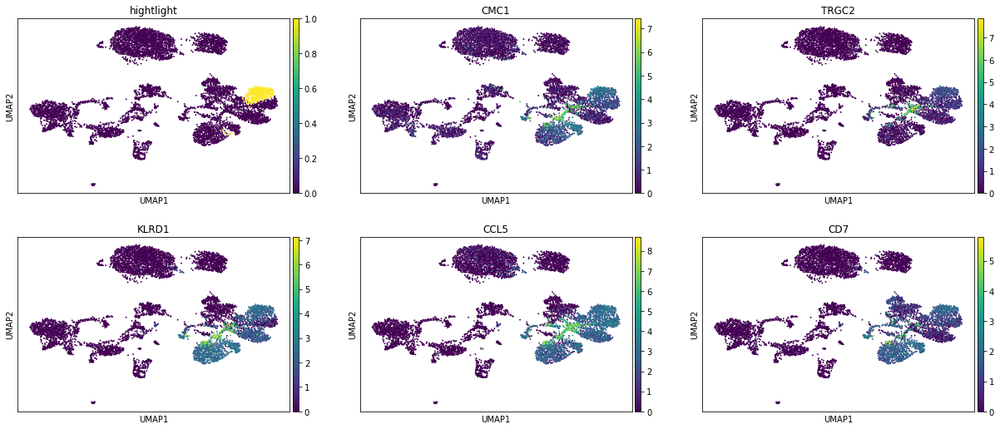

7


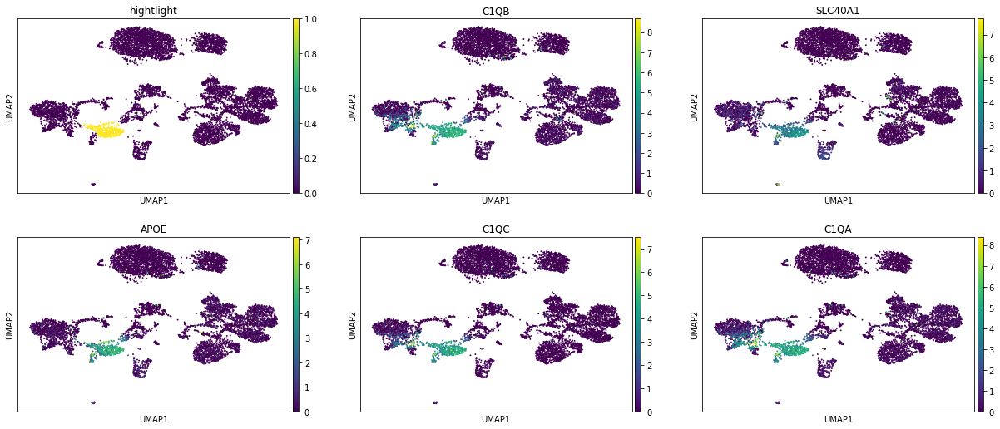

8


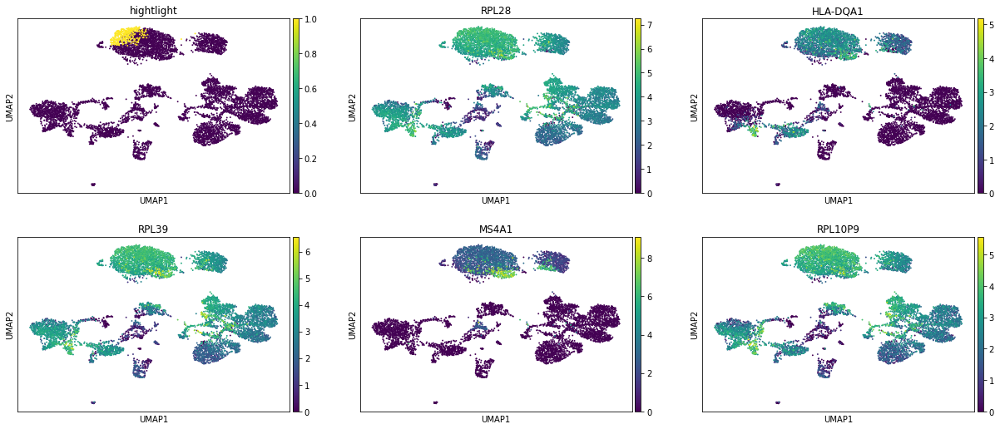

9


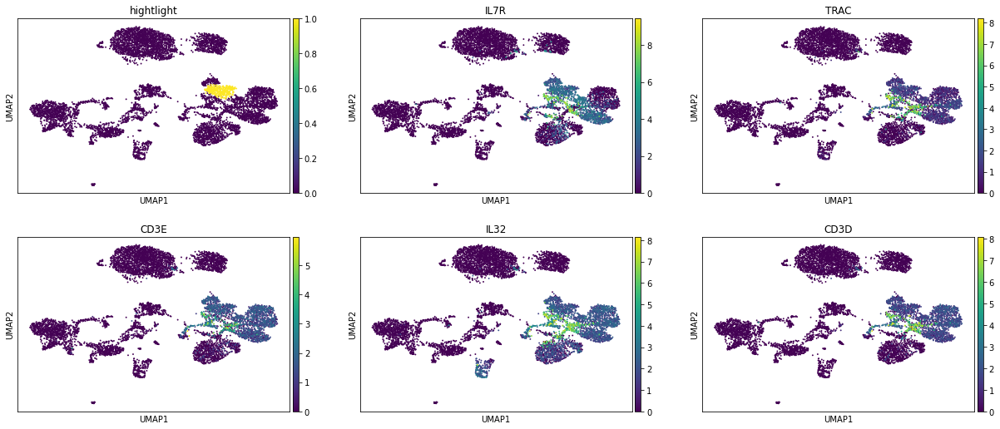

10


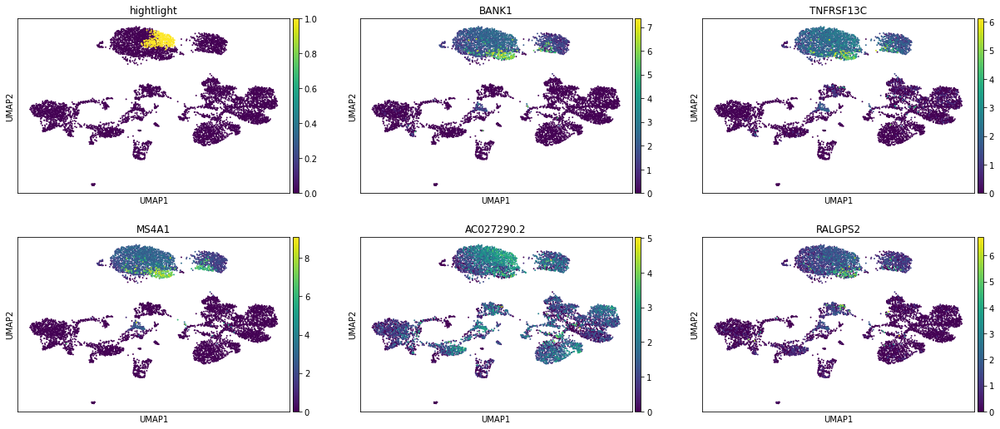

11


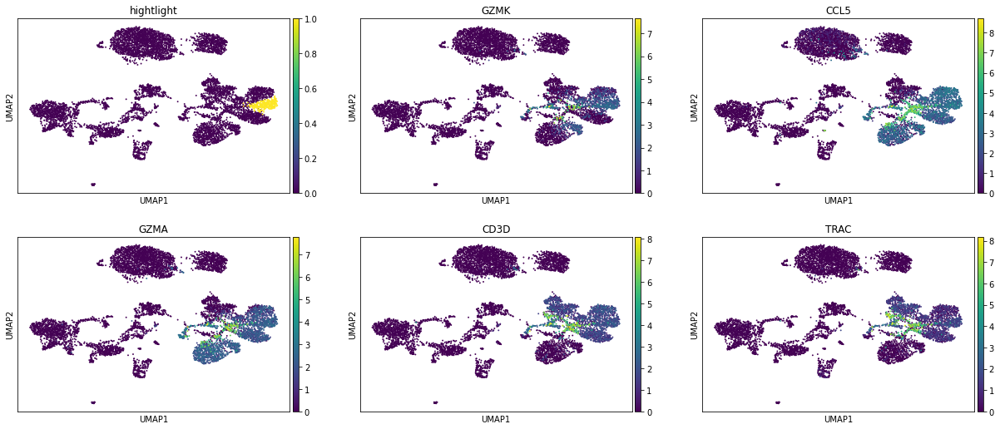

12


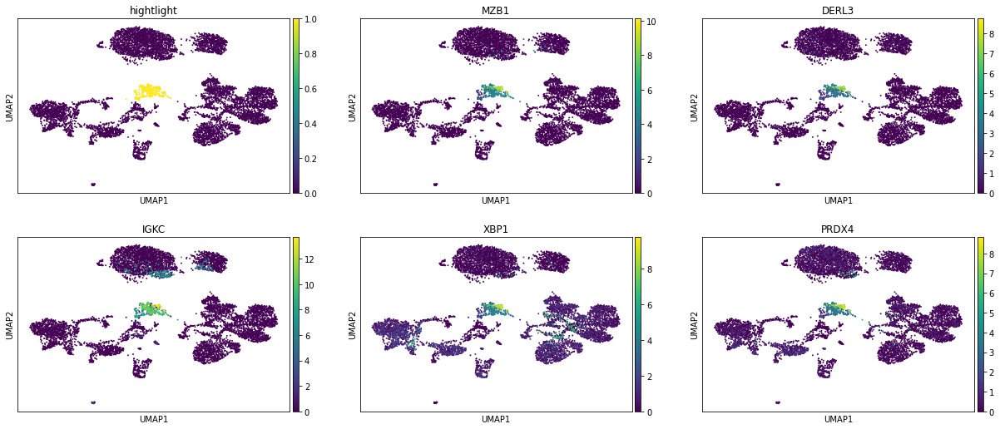

13


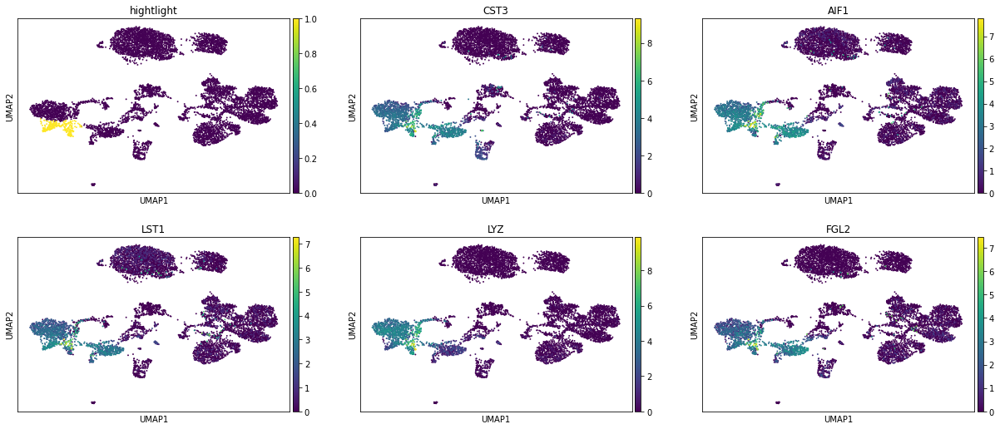

14


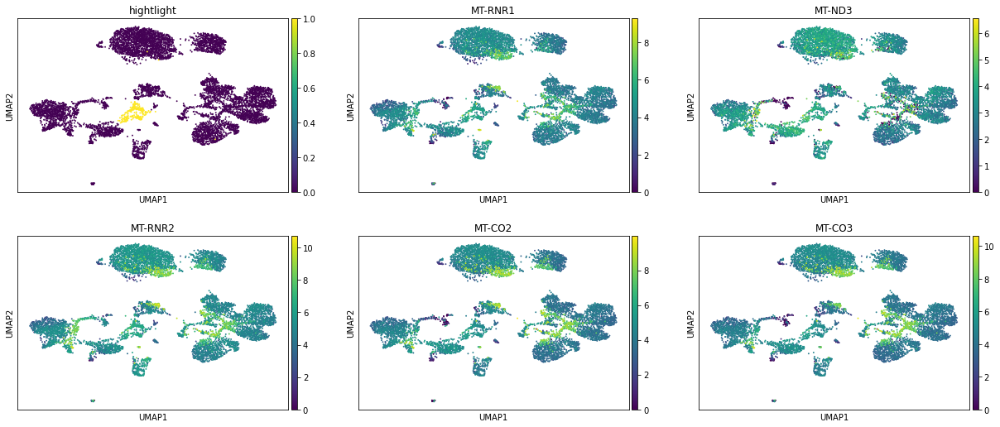

15


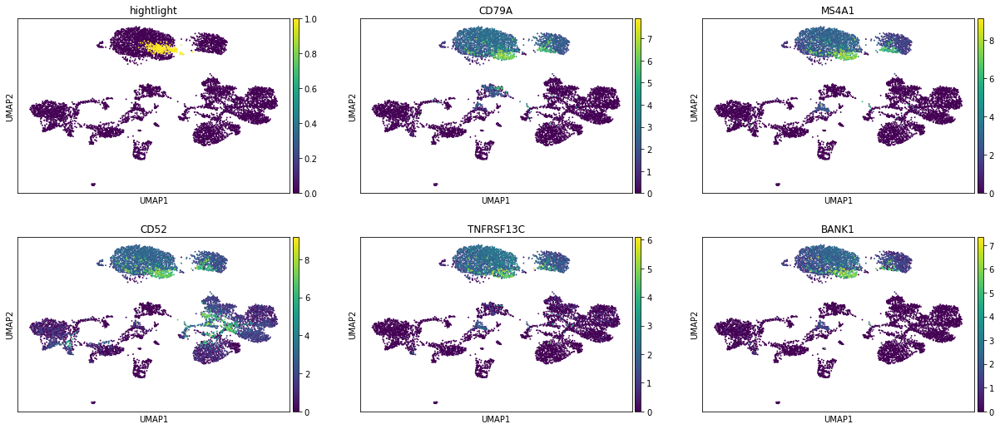

16


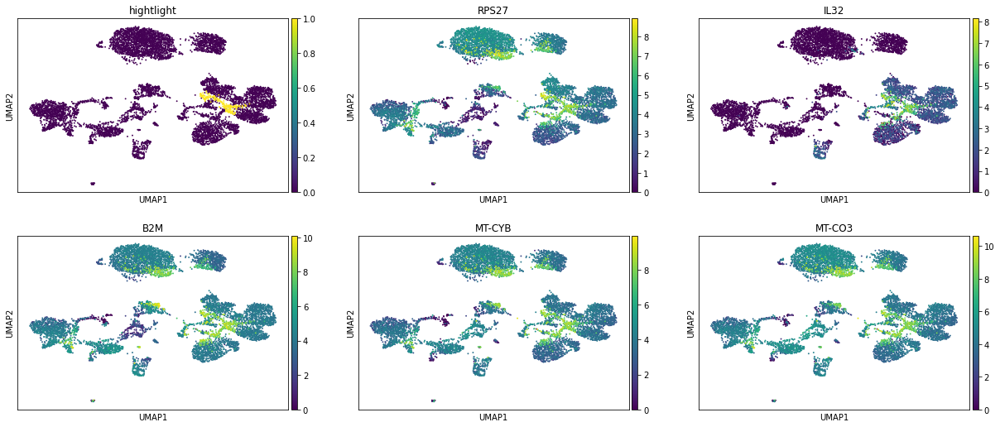

17


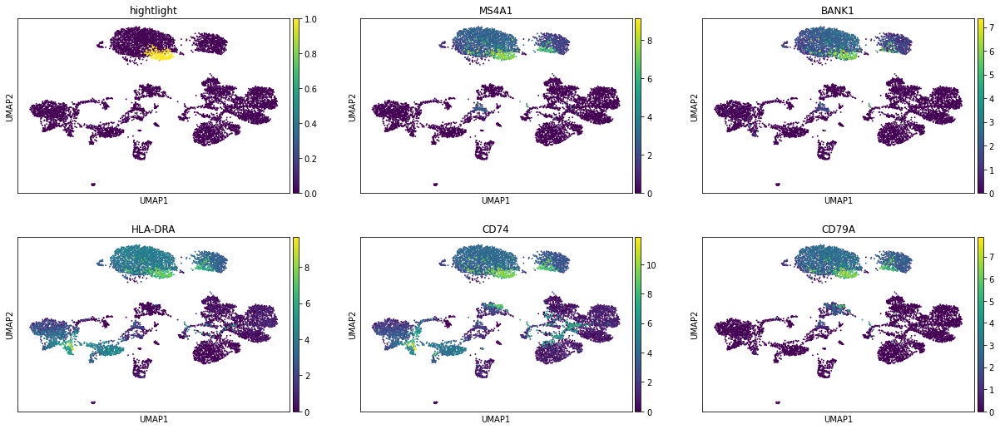

18


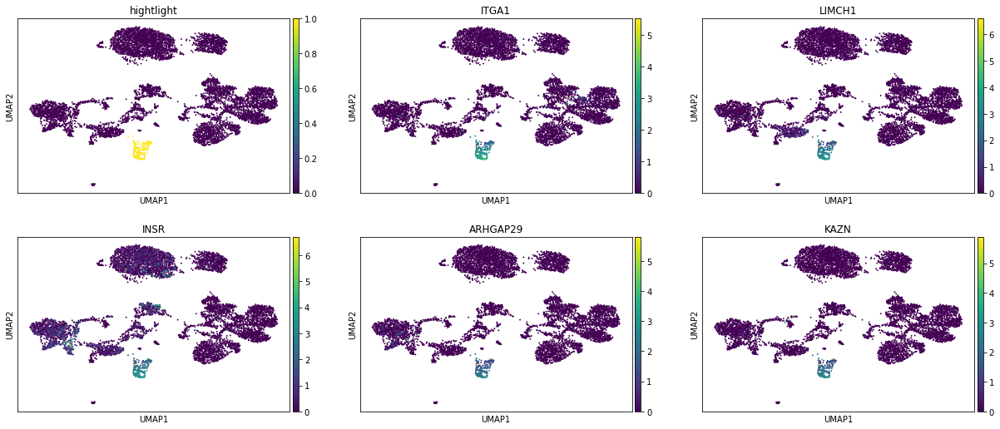

19


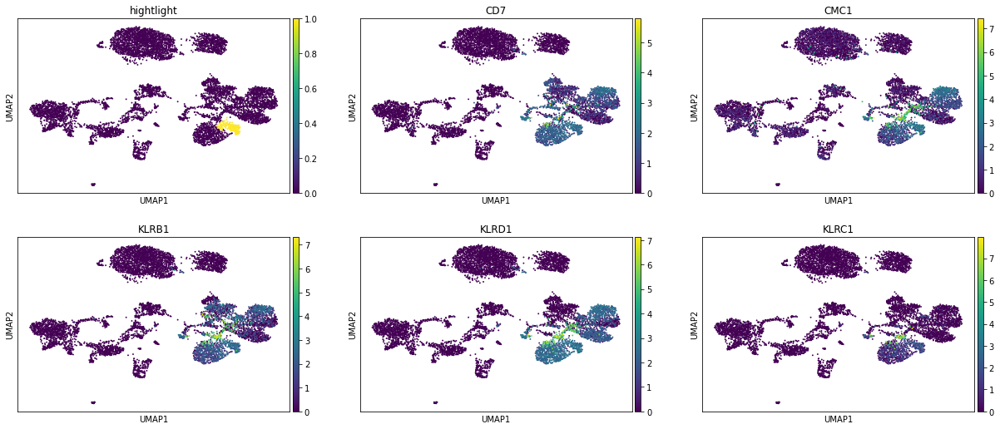

20


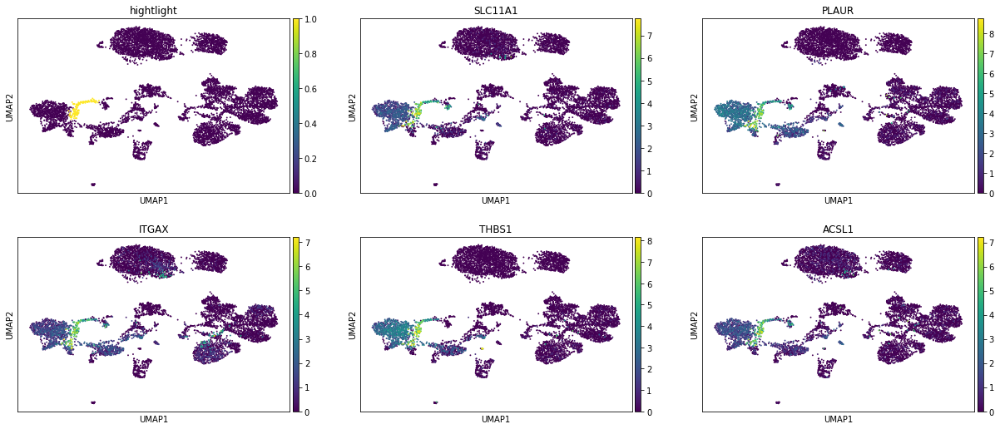

21


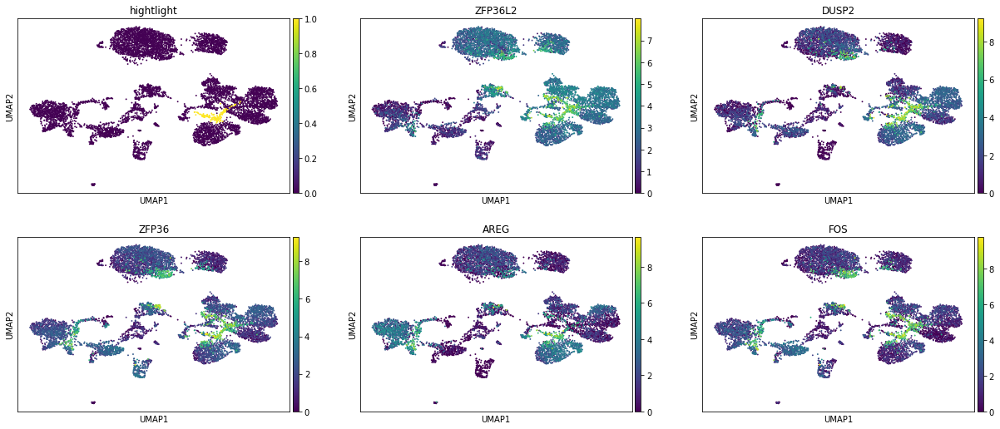

22


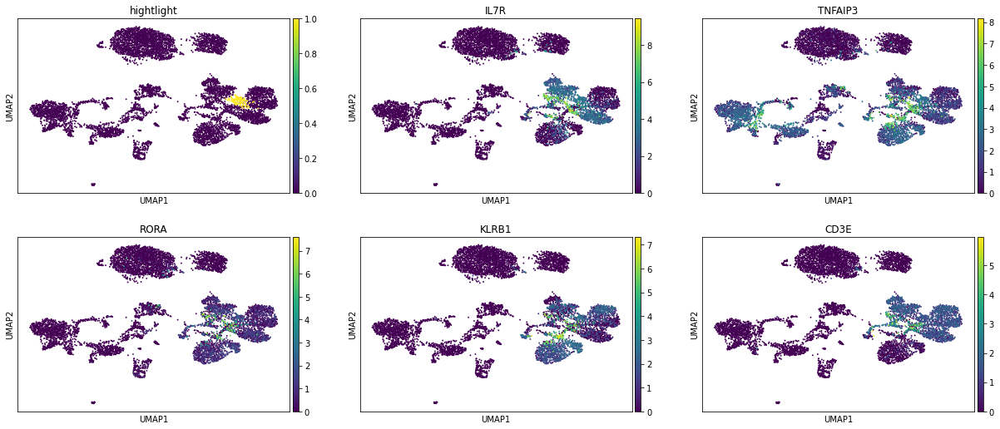

23


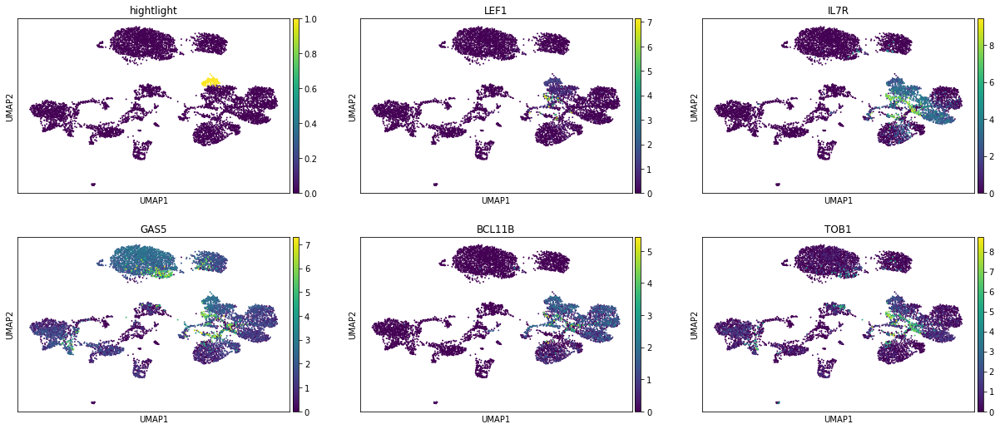

24


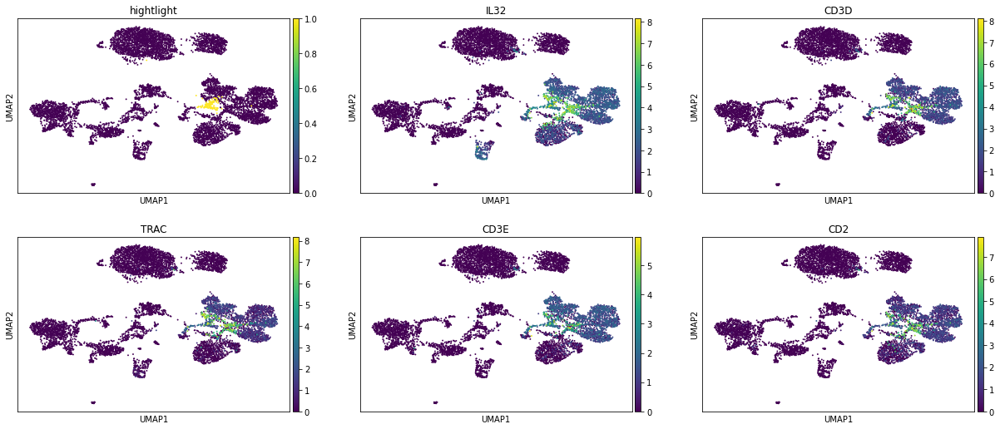

25


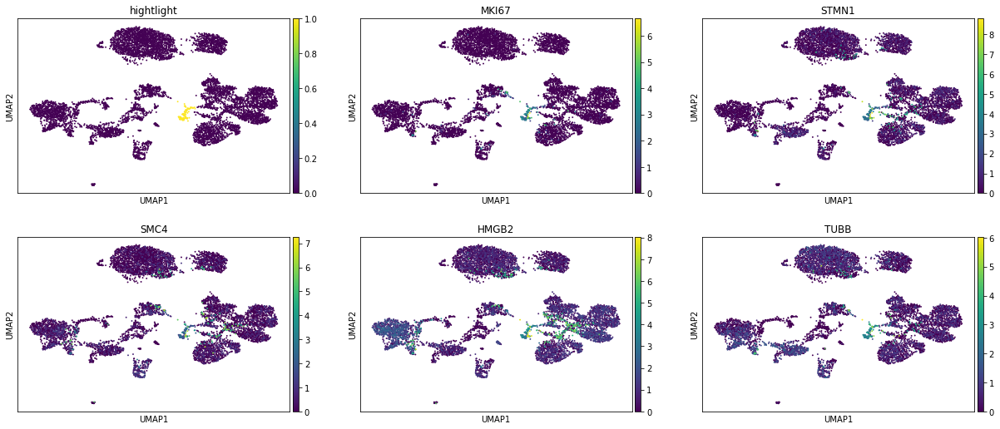

26


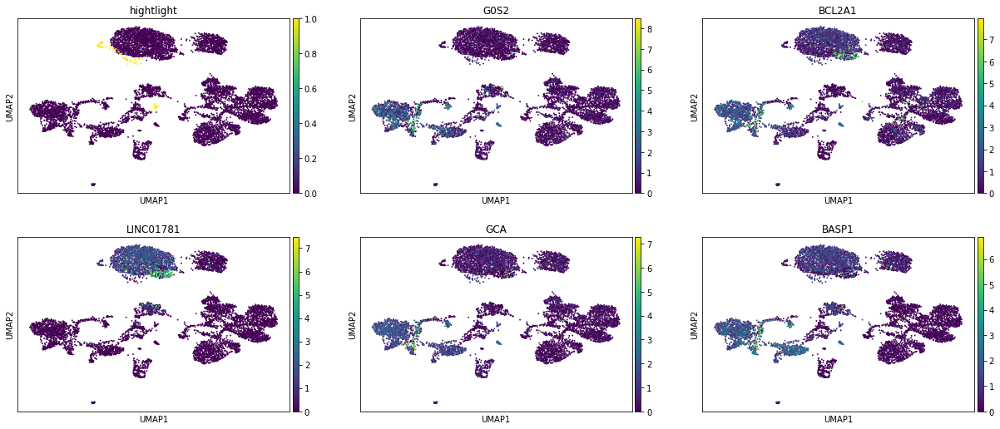

27


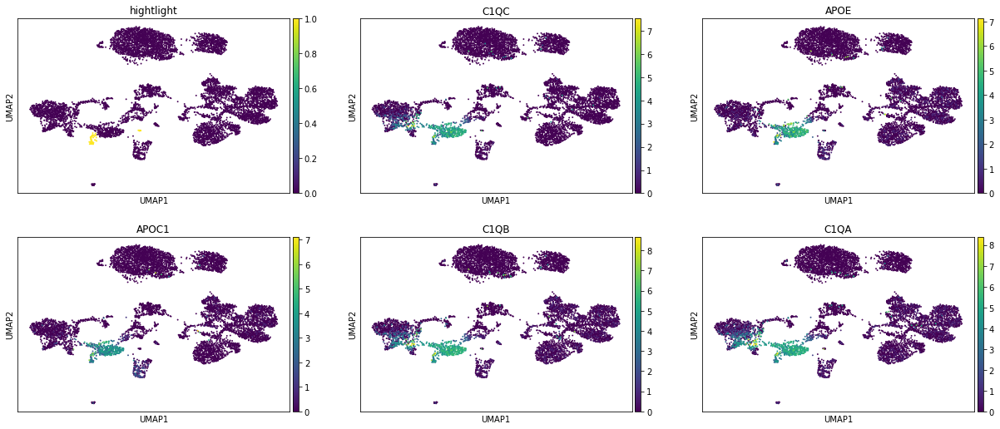

28


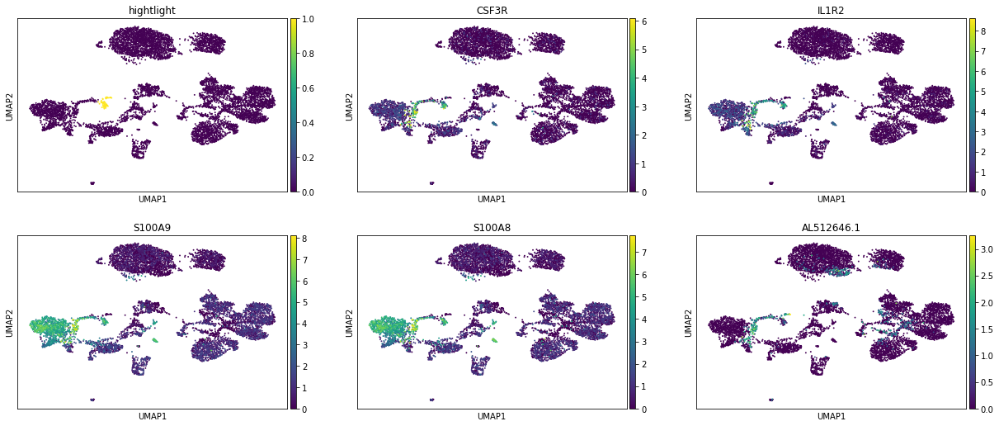

29


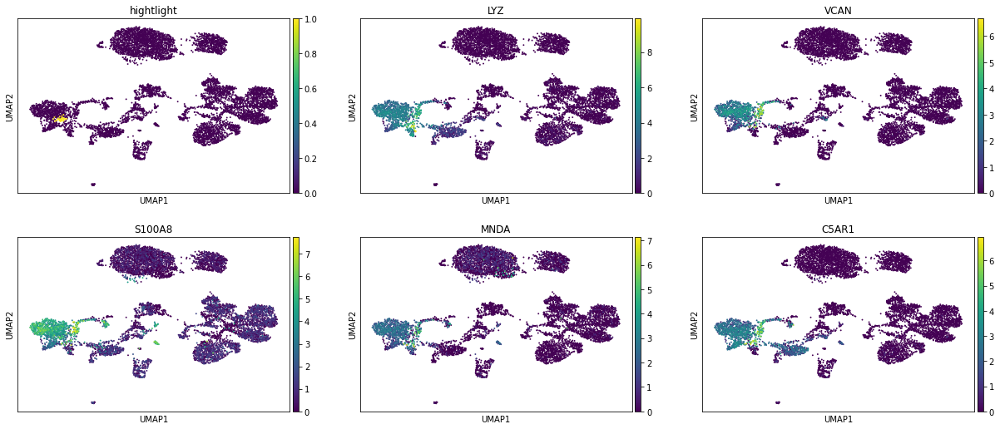

30


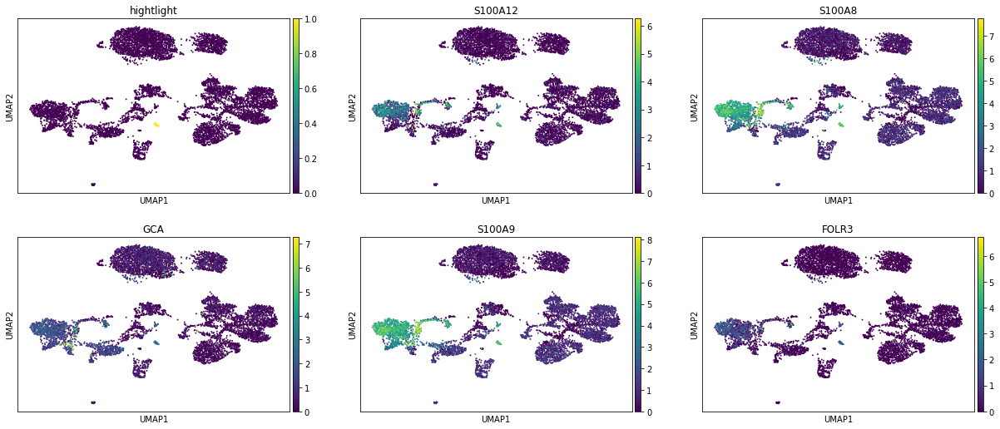

31


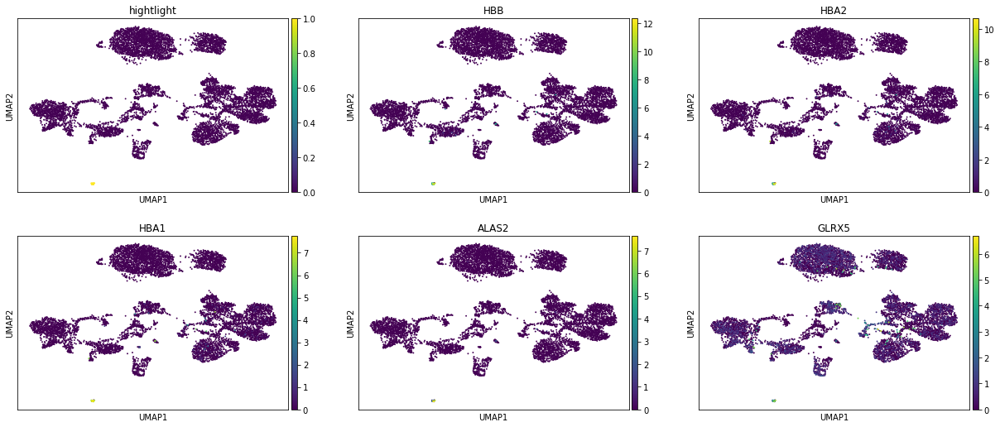

In [25]:
for x in DE.keys():
    print(x)
    topgenes = list(DE[x].T[:5].index)
    organ_adata.obs["hightlight"] = organ_adata.obs["leiden"] == x
    sc.pl.umap(
        organ_adata,
        color=["hightlight"] + topgenes,
        ncols=3,
    )

### The extended DE list can be queried by 

In [26]:
DE["0"].T

,wilcoxon_score,log fold change,adjusted pvalue
S100A9,40.805115,6.685305,0.000000e+00
S100A8,40.728420,6.381565,0.000000e+00
LYZ,40.199532,6.668093,0.000000e+00
VCAN,39.797138,6.454330,0.000000e+00
FCN1,39.607647,6.218126,0.000000e+00
...,...,...,...
TXNIP,-28.716949,-3.198903,1.499810e-178
CD69,-29.191069,-7.123024,1.743738e-184
TSC22D3,-29.241850,-3.023727,3.995119e-185
ZFP36L2,-30.964752,-3.518802,1.578156e-207


# read in cell ontology 

In [27]:
import obonet

ont_dir = "/data/yosef2/users/chenling/TabulaSapiensData/ontology/"
obo = ont_dir + "cl.obo.txt"
f = open(obo, "r")
co = obonet.read_obo(f)
f.close()

celltype_dict = {}
for x in co.nodes:
    celltype_dict[co.nodes[x]['name']] = x



You can look up all T cell by typing celltype_dict['T'] and using tab complete  

In [28]:
celltype_dict['T cell']

'CL:0000084'

You can also look at the names of all subsets of T cell that contains 'CD4' in their names

In [29]:
import networkx as nx


def PrintChildren(co, parent, pattern=""):
    all_children = [x for x in nx.ancestors(co, celltype_dict[parent])]
    return [co.nodes[x]["name"] for x in all_children if pattern in co.nodes[x]["name"]]


PrintChildren(co, "T cell", "CD4")

['CD4-negative, CD8-negative type I NK T cell secreting interleukin-4',
 'CD4-positive, alpha-beta cytotoxic T cell',
 'CD4-positive, alpha-beta memory T cell',
 'CD69-positive, CD4-positive single-positive thymocyte',
 'effector memory CD4-positive, alpha-beta T cell',
 'CD4-positive, alpha-beta thymocyte',
 'CD4-positive type I NK T cell secreting interleukin-4',
 'CD4-positive, alpha-beta intraepithelial T cell',
 'naive thymus-derived CD4-positive, alpha-beta T cell',
 'activated CD4-positive, CD25-positive, CCR4-positive, alpha-beta regulatory T cell, human',
 'CD4-positive, CD25-positive, CCR4-positive, alpha-beta regulatory T cell',
 'mature CD4 single-positive thymocyte',
 'activated CD4-negative, CD8-negative type I NK T cell',
 'CD4-negative, CD8-negative, alpha-beta intraepithelial T cell',
 'CD4-positive type I NK T cell',
 'CD4-negative, CD8-negative type I NK T cell',
 'CD2-positive, CD5-positive, CD44-positive alpha-beta intraepithelial T cell',
 'CD4-intermediate, CD8-p

# manually create mapping between cluster and cell type (this is just an example), and the relevant marker genes that was used to generate this prediction

In [30]:
organ_adata.obs["annotation_oct2020"] = organ_adata.obs["leiden"].copy()
cluster_mapping = {"0": "T cell"}
cluster_markers = {"0": ["CXCR4", "CD3D", "IL7R", "IL32"]}

This cell will automatically replace the leiden cluster names with cell type annotations

In [31]:
for l in cluster_mapping.keys():
    organ_adata.obs["annotation_oct2020"].replace(l, cluster_mapping[l], inplace=True)
    display(DE[l][cluster_markers[l]])

,CXCR4,CD3D,IL7R,IL32
wilcoxon_score,-3.515578e+01,-1.125468e+01,-9.074511e+00,-1.567084e+01
log fold change,-4.554141e+00,-2.926458e+01,-2.969423e+01,-7.691523e+00
adjusted pvalue,2.147993e-267,1.496500e-27,5.564860e-18,2.918037e-53


# Visualize the results of the manual annotation

/data/yosef2/users/chenling/miniconda3/envs/scvi-tools/lib/python3.8/site-packages/anndata/_core/anndata.py:1192: FutureWarning:

is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead



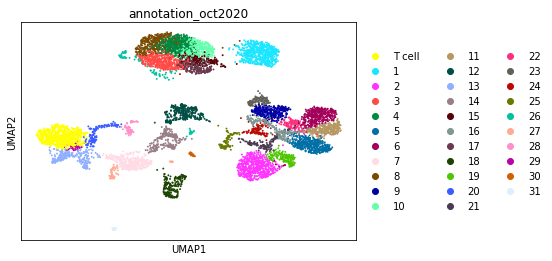

In [32]:
sc.pl.umap(
    organ_adata,
    color=["annotation_oct2020"],
    ncols=3,
)

# manually create mapping between cell type and compartment (this is just an example)

In [33]:
organ_adata.obs["compartment_oct2020"] = organ_adata.obs["annotation_oct2020"].copy()
compartment_mapping = {"T cell": "Immune"}

This cell will automatically replace the leiden cluster names with cell type annotations

In [34]:
for c in compartment_mapping.keys():
    organ_adata.obs["compartment_oct2020"].replace(
        c, compartment_mapping[c], inplace=True
    )

# Visualize the results of the new compartment splitting

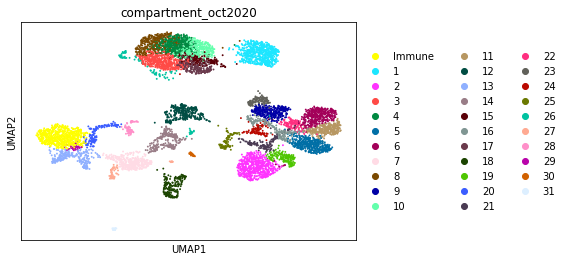

In [35]:
sc.pl.umap(
    organ_adata,
    color=["compartment_oct2020"],
    ncols=3,
)

# save data

In [36]:
organ_adata.write_h5ad(
    data_path + "decontX/organ_data/Pilot1_Pilot2.decontX.%s.h5ad" % organ
)